Learning Transformer

这个主要做baseline，也就是给一对时间序列的图片，然后让模型自己生成目标的恢复之后的结果。


这个既不用时间序列，也不用参考照片，只用目标序列前后的图片


然后云用mask做掩码来掩盖掉训练时的损失。

这个可以做baseline，因为他非常简单，并且比较容易实现。

现在用RGB来重建NDVI

In [3]:
# --------------------------------------------------------------------
# Importing required libraries
# --------------------------------------------------------------------
import random
import numpy as np
import pandas as pd
import PIL.Image as Image
from glob import glob
from mymodels import VisionTransformer, ReconNet
from mymodels.unet import Unet
from mymodels.discriminatorv2 import Discriminator
import matplotlib.pyplot as plt
from myutils import imshow
from datetime import datetime

# importing pytorch functions
import torch
from torchvision.utils import make_grid
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as tvtransforms
from torch.nn import SmoothL1Loss, BCELoss

# importing utils required in th code
from utils import subsample
from utils import transforms
from utils.evaluate import ssim, psnr, nmse
from utils.losses import (
    SSIMLoss,
    SSIMLoss_V1,
    MultiScaleLoss,
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)
from utils.process import transform_tensor_image, RealisticCloudMaskFunc
from osgeo import gdal
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import mean_squared_error
import math

# Device
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
# device = 'cuda'
# np.random.seed(42)
# random.seed(42)

print("******* STARTED AT ************", datetime.now())

******* STARTED AT ************ 2025-01-09 20:51:39.898883


In [4]:
class ImagenetDataset(Dataset):
    def __init__(
        self,
        isval=False,
        add_cloud_mask=True,
        add_kspace_mask=False,
        val_path="/home/snt/projects_lujun/Image-Reconstruction-by-Vision-Transformer/output_all_times/val",
        train_path="/home/snt/projects_lujun/Image-Reconstruction-by-Vision-Transformer/output_all_times/train",
    ):

        self.add_cloud_mask = add_cloud_mask
        self.add_kspace_mask = add_kspace_mask
        self.val_path = val_path
        self.train_path = train_path
        if isval:
            ## combine paths of each imagenet validation image into a single list
            self.files = []
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.val_path):
                self.files.extend(glob(os.path.join(dir, pattern)))
        else:
            ## combine paths of each imagenet training image into a single list
            self.files = []  # get path of each imagenet images
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.train_path):
                self.files.extend(glob(os.path.join(dir, pattern)))

        self.transform = transform_tensor_image
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]

    def read_tiff(self, file_path):
        dataset = gdal.Open(file_path)
        if not dataset:
            raise FileNotFoundError(f"Unable to open the file: {file_path}")
        band_count = dataset.RasterCount
        bands_data = []
        for i in range(1, band_count + 1):
            band = dataset.GetRasterBand(i)
            band_name = band.GetDescription()
            band_data = band.ReadAsArray()
            bands_data.append(band_data)

        image = np.stack(bands_data, axis=0)
        return image

    def get_mask_func(
        self,
        samp_style,
        factor,
    ):
        center_fractions = 0.08 * 4 / factor
        if samp_style == "random":
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        elif samp_style == "equidist":
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        return mask_func

    def add_gaussian_noise(self, x):
        ch, row, col = x.shape
        mean = 0
        var = 0.05
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (ch, row, col))
        gauss = gauss.reshape(ch, row, col)
        noisy = x + gauss
        return noisy.float()

    def __len__(
        self,
    ):
        return len(self.files)

    def __getitem__(self, idx):
        channel_count = 11
        tiff = torch.from_numpy(self.read_tiff(self.files[idx]))
        file_path = self.files[idx]
        file_name = os.path.basename(file_path)
        tiff = self.transform(tiff, target_size=64 * 3, crop_size=60 * 3)
        channels, height, width = tiff.shape
        time_span = int((channels - 1) / channel_count)
        image = tiff[0:channel_count, :, :]

        y = image
        cloud_mask = torch.isnan(y).any(dim=0)
        cloud_mask = (~cloud_mask).int()
        y[:, cloud_mask == 0] = 0
        original_spaces_transformed = y.clone()
        masked_kspace = y.clone()

        if random.uniform(0, 1) < 0.5:
            y = torch.rot90(y, 1, [-2, -1])

        if random.uniform(0, 1) < 0.5:
            samp_style = "random"
        else:
            samp_style = "equidist"

        # factor = random.choice(self.factors)
        mask_func = self.get_mask_func(samp_style, factor=2.0)

        if self.add_kspace_mask:  # add kspace mask
            masked_kspace, _ = transforms.apply_mask(masked_kspace, mask_func)
        if self.add_cloud_mask:  # add cloud mask
            masked_kspace, added_cloud_mask = RealisticCloudMaskFunc(masked_kspace)
            added_cloud_mask = added_cloud_mask.unsqueeze(0)
        else:
            added_cloud_mask = torch.ones_like(cloud_mask.unsqueeze(0))

        return (
            masked_kspace,  # inputs
            original_spaces_transformed,  # tragets
            cloud_mask,
            added_cloud_mask,
            file_name,
        )


train_dataset = ImagenetDataset(
    isval=False,
    add_cloud_mask=True,
    add_kspace_mask=False,
)


# ntrain = 1000
# train_dataset, _ = torch.utils.data.random_split(
#     train_dataset,
#     [ntrain, len(train_dataset) - ntrain],
#     generator=torch.Generator().manual_seed(42),
# )

val_dataset = ImagenetDataset(
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=False,
)

batch_size = 15
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

Test the mask and future application

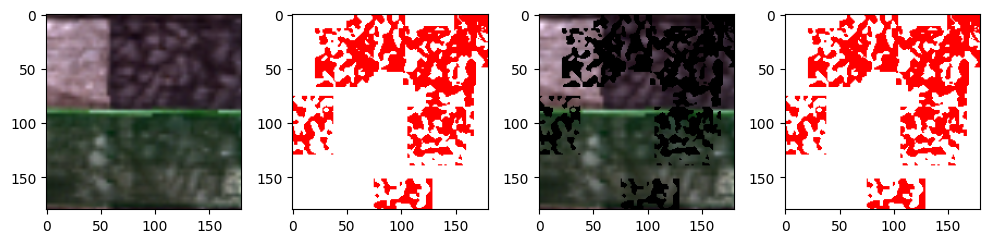

In [5]:
def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


def create_time_series_pseudo_color_image(iamge, cloud_mask, added_cloud_mask):
    channel_count = 11
    channel_list = [3, 2, 1]
    channels, h, w = iamge.shape
    image = iamge[0:channel_count, :, :]

    image = np.transpose(image, (1, 2, 0))
    pseudo_color_image = image[:, :, channel_list]
    # nan_mask = np.isnan(pseudo_color_image).any(axis=-1)  # 掩码，标记 NaN 的位置

    background_cloud_image = np.full((h, w, 3), 0, dtype=np.uint8)  # ALL black
    background_cloud_image[cloud_mask.squeeze(0) == 1] = [
        255,
        255,
        255,
    ]  # Eecept mask white

    background_cloud_image[added_cloud_mask.squeeze(0) == 0] = [
        255,
        0,
        0,
    ]
    return pseudo_color_image, background_cloud_image


def test_image_transformation(dataset, idx):

    masked_kspace, original_image, cloud_mask, added_cloud_masks_concat, _ = dataset[
        idx
    ]
    time_series_images_original, background_cloud_images_original = (
        create_time_series_pseudo_color_image(
            original_image, cloud_mask, added_cloud_masks_concat
        )
    )
    time_series_images_masked, background_cloud_images_masked = (
        create_time_series_pseudo_color_image(
            masked_kspace, cloud_mask, added_cloud_masks_concat
        )
    )
    all_images = [
        time_series_images_original,
        background_cloud_images_original,
        time_series_images_masked,
        background_cloud_images_masked,
    ]

    fig, axes = plt.subplots(1, len(all_images), figsize=(10, 10))
    dict_name = {
        0: "Original",
        1: "Mask",
        2: "Masked",
        3: "Masked+Cloud",
    }
    for i, image in enumerate(all_images):
        axes[i].imshow(image)
        axes[i].axis("on")
    plt.tight_layout()
    plt.show()


idx = 20
test_image_transformation(train_dataset, idx)

In [6]:
# --------------------------------------------------------------------
# Initialising Models
# --------------------------------------------------------------------
masked_kspace, _, _, _, _ = train_dataset[0]
C, H, W = masked_kspace.shape

channel_count = 11
avrg_img_size = 180  # Don't change this
patch_size = 5  # 10
depth = 6
num_heads = 8
embed_dim = 11  # 64
time_span = C // channel_count
in_chans = C
epoch_max = 100
lr = 1e-4
is_SGD = False
batch_size = 60
seed = 42

current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}_reconstruction_single_vit"
path = log_dir


torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)


net = VisionTransformer(
    avrg_img_size=avrg_img_size,
    patch_size=patch_size,
    in_chans=in_chans,
    embed_dim=embed_dim,
    depth=depth,
    num_heads=num_heads,
    is_LSA=False,  # ---------------Parameter for adding LSA component
    is_SPT=False,  # ---------------Parameter for adding SPT component
    rotary_position_emb=False,  # ---------------Parameter for adding ROPE component
    use_pos_embed=True,
)


model = ReconNet(net).to(device)

## Set biases to zero
for name, param in model.named_parameters():
    if name.endswith(".bias"):
        torch.nn.init.constant_(param, 0)
        param.requires_grad = False

print("#Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(model)


# --------------------------------------------------------------------
# Function to Save model
# --------------------------------------------------------------------
def save_model(path, model, train_hist, optimizer, scheduler=None, epoch=None):
    if epoch is None:
        epoch = 0
    else:
        epoch = epoch + 1
    net = model.net
    if scheduler:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler": scheduler.state_dict(),
        }
    else:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
        }

    torch.save(train_hist, path + f"/train_hist_{epoch}.pt")
    torch.save(checkpoint, path + f"/checkpoint_{epoch}.pth")


"""Choose optimizer"""

# criterion = SSIMLoss_V1(window_size=11, channel=1).to(device)
# criterion = ms_ssim().to(device)
# criterion = piq.ssim().to(device)
criterion = MultiScaleLoss(scales=[1, 0.5, 0.25], weight_mse=1.0, weight_sam=1.0).to(
    device
)


if is_SGD:
    optimizerG = optim.SGD(
        model.parameters(),
        lr=lr,
        momentum=0.9,
    )
    cycle_momentum = True
    base_momentum = (0.85,)
    max_momentum = (0.95,)

else:
    optimizerG = optim.Adam(model.parameters(), lr=0.0)
    cycle_momentum = False
    base_momentum = 0.0
    max_momentum = 0.0

train_hist = []

scheduler = optim.lr_scheduler.OneCycleLR(
    optimizerG,
    max_lr=lr,
    total_steps=epoch_max,
    pct_start=0.1,
    anneal_strategy="cos",
    cycle_momentum=cycle_momentum,
    base_momentum=base_momentum,
    max_momentum=max_momentum,
    div_factor=0.1 * epoch_max,
    final_div_factor=9,
)


def check_nan_in_tensors(*tensors):
    for idx, tensor in enumerate(tensors):
        if torch.isnan(tensor).any():
            print(f"Tensor {idx} contains NaN values.")
            return True
    print("No NaN values found in the provided tensors.")
    return False

#Params: 1278728
ReconNet(
  (net): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(11, 88, kernel_size=(5, 5), stride=(5, 5))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-5): 6 x Block(
        (norm1): LayerNorm((88,), eps=1e-05, elementwise_affine=True)
        (attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=88, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, out_features=88, bias=True)
            (1): Dropout(p=0.0, inplace=False)
          )
        )
        (drop_path): Identity()
        (norm2): LayerNorm((88,), eps=1e-05, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=88, out_features=352, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=352, out_features=88, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
    )
  

Start to train the model

Training Progress: 100%|██████████| 176/176 [03:40<00:00,  1.25s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2491012..1.6536888].


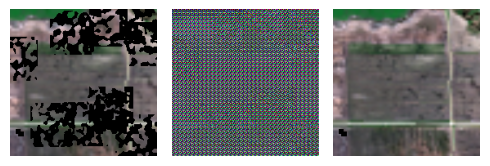

Epoch 1, Train loss.: 3.7330e+00


Training Progress: 100%|██████████| 176/176 [03:31<00:00,  1.20s/it]


Epoch 2, Train loss.: 2.3377e+00


Training Progress: 100%|██████████| 176/176 [03:31<00:00,  1.20s/it]


Epoch 3, Train loss.: 1.8624e+00


Training Progress: 100%|██████████| 176/176 [03:32<00:00,  1.21s/it]


Epoch 4, Train loss.: 1.6995e+00


Training Progress: 100%|██████████| 176/176 [03:33<00:00,  1.21s/it]


Epoch 5, Train loss.: 1.6224e+00
Model saved at epoch 5


Training Progress: 100%|██████████| 176/176 [03:33<00:00,  1.21s/it]


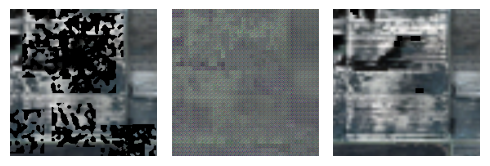

Epoch 6, Train loss.: 1.5743e+00


Training Progress: 100%|██████████| 176/176 [03:32<00:00,  1.21s/it]


Epoch 7, Train loss.: 1.5422e+00


Training Progress: 100%|██████████| 176/176 [03:30<00:00,  1.20s/it]


Epoch 8, Train loss.: 1.5256e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 9, Train loss.: 1.5079e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 10, Train loss.: 1.4960e+00
Model saved at epoch 10


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02311476..0.6669367].


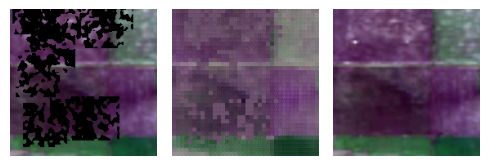

Epoch 11, Train loss.: 1.4878e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 12, Train loss.: 1.4790e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 13, Train loss.: 1.4725e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 14, Train loss.: 1.4690e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 15, Train loss.: 1.4612e+00
Model saved at epoch 15


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023798164..0.82410276].


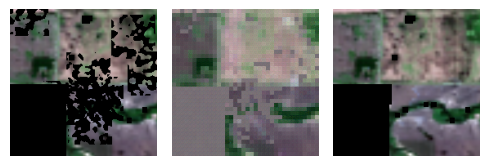

Epoch 16, Train loss.: 1.4567e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 17, Train loss.: 1.4549e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 18, Train loss.: 1.4505e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.19s/it]


Epoch 19, Train loss.: 1.4490e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 20, Train loss.: 1.4453e+00
Model saved at epoch 20


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


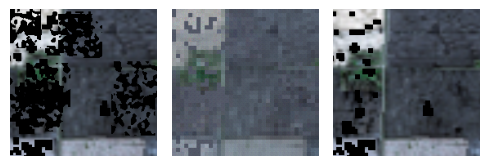

Epoch 21, Train loss.: 1.4424e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 22, Train loss.: 1.4404e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.19s/it]


Epoch 23, Train loss.: 1.4388e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 24, Train loss.: 1.4355e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 25, Train loss.: 1.4337e+00
Model saved at epoch 25


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.19s/it]


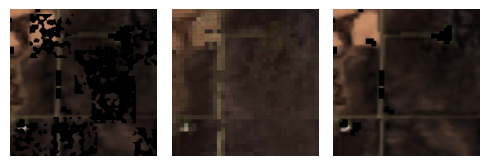

Epoch 26, Train loss.: 1.4316e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 27, Train loss.: 1.4285e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 28, Train loss.: 1.4236e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 29, Train loss.: 1.4184e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 30, Train loss.: 1.4148e+00
Model saved at epoch 30


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


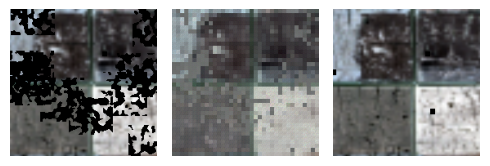

Epoch 31, Train loss.: 1.4122e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.18s/it]


Epoch 32, Train loss.: 1.4104e+00


Training Progress: 100%|██████████| 176/176 [04:11<00:00,  1.43s/it]


Epoch 33, Train loss.: 1.4093e+00


Training Progress: 100%|██████████| 176/176 [06:08<00:00,  2.10s/it]


Epoch 34, Train loss.: 1.4070e+00


Training Progress: 100%|██████████| 176/176 [05:30<00:00,  1.88s/it]


Epoch 35, Train loss.: 1.4071e+00
Model saved at epoch 35


Training Progress: 100%|██████████| 176/176 [05:12<00:00,  1.78s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051026907..0.06353489].


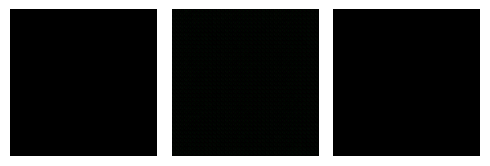

Epoch 36, Train loss.: 1.4048e+00


Training Progress: 100%|██████████| 176/176 [03:33<00:00,  1.21s/it]


Epoch 37, Train loss.: 1.4051e+00


Training Progress: 100%|██████████| 176/176 [03:28<00:00,  1.19s/it]


Epoch 38, Train loss.: 1.4039e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 39, Train loss.: 1.4030e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 40, Train loss.: 1.4026e+00
Model saved at epoch 40


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026897388..0.8235958].


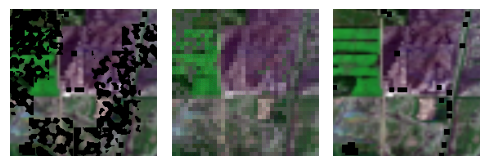

Epoch 41, Train loss.: 1.4020e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 42, Train loss.: 1.4007e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 43, Train loss.: 1.4004e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 44, Train loss.: 1.3992e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 45, Train loss.: 1.3993e+00
Model saved at epoch 45


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014900613..0.61619675].


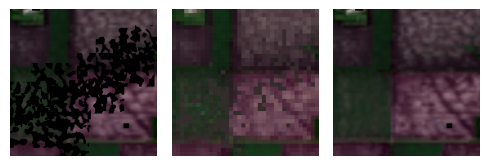

Epoch 46, Train loss.: 1.3992e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.18s/it]


Epoch 47, Train loss.: 1.3984e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 48, Train loss.: 1.3972e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


Epoch 49, Train loss.: 1.3964e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


Epoch 50, Train loss.: 1.3955e+00
Model saved at epoch 50


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


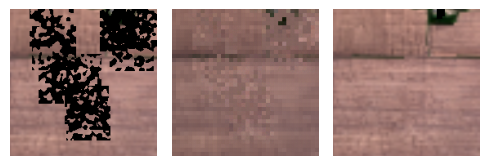

Epoch 51, Train loss.: 1.3957e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


Epoch 52, Train loss.: 1.3948e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.18s/it]


Epoch 53, Train loss.: 1.3938e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


Epoch 54, Train loss.: 1.3923e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.17s/it]


Epoch 55, Train loss.: 1.3926e+00
Model saved at epoch 55


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009684697..1.0478938].


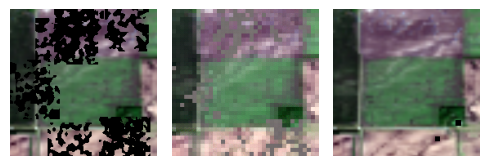

Epoch 56, Train loss.: 1.3917e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 57, Train loss.: 1.3915e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 58, Train loss.: 1.3904e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 59, Train loss.: 1.3906e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 60, Train loss.: 1.3898e+00
Model saved at epoch 60


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


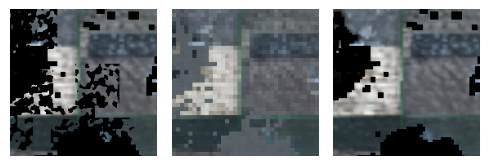

Epoch 61, Train loss.: 1.3900e+00


Training Progress: 100%|██████████| 176/176 [03:26<00:00,  1.18s/it]


Epoch 62, Train loss.: 1.3889e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 63, Train loss.: 1.3887e+00


Training Progress: 100%|██████████| 176/176 [03:27<00:00,  1.18s/it]


Epoch 64, Train loss.: 1.3873e+00


Training Progress:  38%|███▊      | 66/176 [01:18<02:11,  1.19s/it]


KeyboardInterrupt: 

In [41]:
# --------------------------------------------------------------------
# Start to train the model
# --------------------------------------------------------------------

# ----------- discriminator parameters to test Adverserial loss addition to the network
# Initialize TensorBoard writer
writer = SummaryWriter(log_dir=log_dir)
from tqdm import tqdm

for epoch in range(0, epoch_max):  # loop over the dataset multiple times
    model.train()
    train_loss = 0.0

    ################################################################### Training ###################################################################
    for i, data in enumerate(tqdm(trainloader, desc="Training Progress")):

        inputs, targets, cloud_mask, _, _ = data
        optimizerG.zero_grad()

        outputs = model(inputs.to(device))
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.unsqueeze(1).repeat_interleave(11, dim=1)
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)

        # Normalize the masked regions to avoid scale bias
        valid_pixels = cloud_mask.sum()
        if valid_pixels > 0:
            loss = (
                criterion(
                    masked_outputs.to(device),
                    masked_targets.to(device),
                )
                # / valid_pixels
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)
        # loss = criterion(
        #     outputs, targets.to(device), torch.tensor([1.0], device=device)
        # )
        # loss = criterion(outputs, targets.to(device))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            model.parameters(), max_norm=1, norm_type=1, error_if_nonfinite=True
        )
        optimizerG.step()
        train_loss += loss.item()

    writer.add_scalar("Loss/Train", train_loss, epoch)

    if epoch % 5 == 0:  # Every 5 epochs
        ################################################################### Validation ###################################################################
        model.eval()
        val_loss = 0.0
        mse, sam, psnr, ssim = 0, 0, 0, 0

        with torch.no_grad():
            # for inputs, targets, cloud_mask, _ in valloader:
            #     outputs = model(inputs.to(device))
            #     masked_outputs = outputs * (1 - cloud_mask.to(device).unsqueeze(1))
            #     masked_targets = targets.to(device) * (
            #         1 - cloud_mask.to(device).unsqueeze(1)
            #     )
            #     valid_pixels = cloud_mask.sum()
            #     if valid_pixels > 0:
            #         loss = (
            #             criterion(
            #                 masked_outputs.to(device),
            #                 masked_targets.to(device),
            #             )
            #             # / valid_pixels
            #         )
            #     else:
            #         loss = torch.tensor(0.0, device=device, requires_grad=True)

            #     val_loss += loss.item()

            #     masked_outputs_np = masked_outputs.cpu().numpy()
            #     masked_targets_np = masked_targets.cpu().numpy()
            #     mse += mean_squared_error(
            #         masked_targets_np.flatten(), masked_outputs_np.flatten()
            #     )
            #     sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
            #     psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
            #     ssim += structural_similarity_index(
            #         masked_targets_np, masked_outputs_np
            #     )

            # val_loss /= len(valloader)
            # mse /= len(valloader)
            # sam /= len(valloader)
            # psnr /= len(valloader)
            # ssim /= len(valloader)

            # # Log validation loss and metrics to TensorBoard
            # writer.add_scalar("Loss/Validation", val_loss, epoch)
            # writer.add_scalar("Metrics/MSE", mse, epoch)
            # writer.add_scalar("Metrics/SAM", sam, epoch)
            # writer.add_scalar("Metrics/PSNR", psnr, epoch)
            # writer.add_scalar("Metrics/SSIM", ssim, epoch)

            # print(
            #     f"val_loss: {val_loss}, mse: {mse}, sam: {sam}, psnr: {psnr}, ssim: {ssim}"
            # )

            ################################################################### Validation With Images Show ###################################################################
            with torch.no_grad():
                random_indices = random.sample(range(0, 5), 1)
                for i, (inputs, targets, cloud_mask, cloud_mask_added, _) in enumerate(
                    valloader
                ):
                    if i in random_indices:
                        outputs = model(inputs.to(device)).cpu()
                        inputs_RGB, _ = create_time_series_pseudo_color_image(
                            inputs[0, :, :, :].squeeze(0),
                            cloud_mask[0, :, :].squeeze(0),
                            cloud_mask_added[
                                0,
                                :,
                                :,
                            ].squeeze(0),
                        )

                        outputs_RGB, _ = create_time_series_pseudo_color_image(
                            outputs[0, :, :, :].squeeze(0),
                            cloud_mask[0, :, :].squeeze(0),
                            cloud_mask_added[0, :, :].squeeze(0),
                        )

                        targets_RGB, _ = create_time_series_pseudo_color_image(
                            targets[0, :, :, :].squeeze(0),
                            cloud_mask[0, :, :].squeeze(0),
                            cloud_mask_added[0, :, :].squeeze(0),
                        )

                        all_images = [
                            inputs_RGB,
                            outputs_RGB,
                            targets_RGB,
                        ]

                        fig, axes = plt.subplots(1, len(all_images), figsize=(5, 5))
                        dict_name = {
                            0: "inputs_RGB",
                            1: "outputs_RGB",
                            2: "targets_RGB",
                        }
                        for i, image in enumerate(all_images):
                            axes[i].imshow(image)
                            axes[i].axis("off")
                        plt.tight_layout()
                        plt.show()

    scheduler.step()
    train_hist.append(train_loss / len(trainloader))
    save_model(path, model, train_hist, optimizerG, scheduler=scheduler)
    print("Epoch {}, Train loss.: {:0.4e}".format(epoch + 1, train_hist[-1]))
    if (epoch + 1) % 5 == 0:
        save_model(
            path, model, train_hist, optimizerG, scheduler=scheduler, epoch=epoch
        )
        print(f"Model saved at epoch {epoch + 1}")

## Validation Procedure

In [7]:
import torch
from tqdm import tqdm
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"

if_write = False
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}"
path = log_dir
val_path = "/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR_2021/output_patches_time_series_with_city/val"
checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250109-121958_reconstruction_single_vit"

checkpoint_path = f"{checkpoint_base_folder}/{training_model_folder}/checkpoint_60.pth"

outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
inputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_inputs"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"


val_dataset = ImagenetDataset(
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=False,
    val_path=val_path,
)
batch_size = 20
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)


checkpoint = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(checkpoint["model_state_dict"])

# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# epoch = checkpoint['epoch']

print("Checkpoint loaded successfully!")


def write_tiff(output_path, image):
    if image.ndim == 2:
        image = image[np.newaxis, ...]

    bands, height, width = image.shape

    driver = gdal.GetDriverByName("GTiff")
    dataset = driver.Create(
        output_path,
        width,
        height,
        bands,
        gdal.GDT_Float32,
    )

    if dataset is None:
        raise RuntimeError(f"Unable to create TIFF file: {output_path}")

    # Write each band to the dataset
    for i in range(bands):
        band = dataset.GetRasterBand(i + 1)
        band.WriteArray(image[i, :, :])
        band.FlushCache()  # Ensure data is written to disk

    dataset = None

Checkpoint loaded successfully!


/tmp/ipykernel_140873/1860365923.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


In [ ]:
model.eval()
val_loss = 0.0
mse, sam, psnr, ssim = 0, 0, 0, 0

if if_write:
    os.makedirs(outputs_folder, exist_ok=True)
    os.makedirs(targets_folder, exist_ok=True)
    os.makedirs(inputs_folder, exist_ok=True)
    os.makedirs(cloud_mask_folder, exist_ok=True)

# Start validation
with torch.no_grad():
    # Wrap valloader with tqdm for progress tracking
    for batch_idx, (inputs, targets, cloud_mask, _, file_name) in enumerate(
        tqdm(valloader, desc="Validation Progress")
    ):
        outputs = model(inputs.to(device))
        B, C, H, W = inputs.shape
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.unsqueeze(1).repeat_interleave(11, dim=1)
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)

        # Normalize the masked regions to avoid scale bias
        valid_pixels = cloud_mask.sum()
        if valid_pixels > 0:
            loss = (
                criterion(
                    masked_outputs.to(device),
                    masked_targets.to(device),
                )
                # / valid_pixels
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)

        val_loss += loss.item()

        if if_write:
            for i in range(B):  # Process each item in the batch
                base_filename = os.path.splitext(file_name[i])[0]
                output_filename = os.path.join(
                    outputs_folder, f"{base_filename}_output.tiff"
                )
                target_filename = os.path.join(
                    targets_folder, f"{base_filename}_target.tiff"
                )
                input_filename = os.path.join(
                    inputs_folder, f"{base_filename}_input.tiff"
                )
                cloud_mask_filename = os.path.join(
                    cloud_mask_folder, f"{base_filename}_cloud_mask.tiff"
                )

                write_tiff(output_path=target_filename, image=targets[i].cpu().numpy())
                write_tiff(output_path=output_filename, image=outputs[i].cpu().numpy())
                write_tiff(output_path=input_filename, image=inputs[i].cpu().numpy())
                write_tiff(
                    output_path=cloud_mask_filename, image=cloud_mask[i].cpu().numpy()
                )
        # Compute additional metrics
        masked_outputs_np = masked_outputs.cpu().numpy()
        masked_targets_np = masked_targets.cpu().numpy()

        mse += mean_squared_error(
            masked_targets_np.flatten(), masked_outputs_np.flatten()
        )
        sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
        psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
        ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)

    val_loss /= len(valloader)
    mse /= len(valloader)
    sam /= len(valloader)
    psnr /= len(valloader)
    ssim /= len(valloader)

    print(
        f"Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}"
    )

Validation Progress:   0%|          | 0/51 [00:00<?, ?it/s]

Validation Progress: 100%|██████████| 51/51 [01:29<00:00,  1.75s/it]

Validation Loss: 0.5125, MSE: 0.0053, SAM: 0.1788, PSNR: 23.7679, SSIM: 1.3519


## Validation Procesure Time Series

In [19]:
class ImagenetDatasetForValidation(Dataset):
    def __init__(
        self,
        isval=False,
        add_cloud_mask=True,
        add_kspace_mask=False,
        val_path="/home/snt/projects_lujun/Image-Reconstruction-by-Vision-Transformer/output_all_times/val",
        train_path="/home/snt/projects_lujun/Image-Reconstruction-by-Vision-Transformer/output_all_times/train",
    ):

        self.add_cloud_mask = add_cloud_mask
        self.add_kspace_mask = add_kspace_mask
        self.val_path = val_path
        self.train_path = train_path
        if isval:
            ## combine paths of each imagenet validation image into a single list
            self.files = []
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.val_path):
                self.files.extend(glob(os.path.join(dir, pattern)))
        else:
            ## combine paths of each imagenet training image into a single list
            self.files = []  # get path of each imagenet images
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.train_path):
                self.files.extend(glob(os.path.join(dir, pattern)))

        self.transform = transform_tensor_image
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]

    def read_tiff(self, file_path):
        dataset = gdal.Open(file_path)
        if not dataset:
            raise FileNotFoundError(f"Unable to open the file: {file_path}")
        band_count = dataset.RasterCount
        bands_data = []
        for i in range(1, band_count + 1):
            band = dataset.GetRasterBand(i)
            band_name = band.GetDescription()
            band_data = band.ReadAsArray()
            bands_data.append(band_data)

        image = np.stack(bands_data, axis=0)
        return image

    def get_mask_func(
        self,
        samp_style,
        factor,
    ):
        center_fractions = 0.08 * 4 / factor
        if samp_style == "random":
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        elif samp_style == "equidist":
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        return mask_func

    def add_gaussian_noise(self, x):
        ch, row, col = x.shape
        mean = 0
        var = 0.05
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (ch, row, col))
        gauss = gauss.reshape(ch, row, col)
        noisy = x + gauss
        return noisy.float()

    def __len__(
        self,
    ):
        return len(self.files)

    def __getitem__(self, idx):
        channel_count = 13
        tiff = torch.from_numpy(self.read_tiff(self.files[idx]))
        file_path = self.files[idx]
        file_name = os.path.basename(file_path)
        tiff = self.transform(tiff, target_size=64 * 3, crop_size=60 * 3)
        channels, height, width = tiff.shape
        time_span = int((channels - 1) / channel_count)

        images = np.split(
            tiff, [channel_count * (i + 1) for i in range(time_span)], axis=0
        )
        original_spaces_transformed = []
        masked_spaces = []
        cloud_masks = []
        added_cloud_masks = []
        random_index = random.randint(0, len(images) - 2)

        for i in range(len(images) - 1):
            image = images[i]
            image = image[0:11, :, :]
            y = image

            cloud_mask = torch.isnan(y).any(dim=0)
            cloud_mask = (~cloud_mask).int()
            y[:, cloud_mask == 0] = 0
            original_spaces_transformed.append(y.clone())
            masked_kspace = y.clone()

            if random.uniform(0, 1) < 0.5:
                y = torch.rot90(y, 1, [-2, -1])

            if random.uniform(0, 1) < 0.5:
                samp_style = "random"
            else:
                samp_style = "equidist"

            # factor = random.choice(self.factors)
            mask_func = self.get_mask_func(samp_style, factor=2.0)

            if self.add_kspace_mask:  # add kspace mask
                masked_kspace, _ = transforms.apply_mask(masked_kspace, mask_func)
            if self.add_cloud_mask:  # add cloud mask
                masked_kspace, added_cloud_mask = RealisticCloudMaskFunc(
                    masked_kspace, clouds_attributes={"cloud_count": 40}
                )
                added_cloud_masks.append(added_cloud_mask.unsqueeze(0))
            else:
                added_cloud_masks.append(torch.ones_like(cloud_mask.unsqueeze(0)))

            masked_spaces.append(masked_kspace)
            cloud_masks.append(cloud_mask.unsqueeze(0))

        masked_space_concat = torch.cat(masked_spaces, dim=0)
        original_spaces_transformed_concat = torch.cat(
            original_spaces_transformed, dim=0
        )
        cloud_mask_concat = torch.cat(cloud_masks, dim=0)
        added_cloud_masks_concat = torch.cat(added_cloud_masks, dim=0)

        return (
            masked_space_concat,  # inputs
            original_spaces_transformed_concat,  # tragets
            cloud_mask_concat,
            added_cloud_masks_concat,
            file_name,
        )

In [23]:
import torch
from tqdm import tqdm
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"

if_write = False
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}"
path = log_dir
val_path = "/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR/"
checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250109-121958_reconstruction_single_vit"

checkpoint_path = f"{checkpoint_base_folder}/{training_model_folder}/checkpoint_60.pth"

outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
inputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_inputs"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"

batch_size = 20
val_dataset = ImagenetDatasetForValidation(
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=False,
    val_path=val_path,
)

valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)


checkpoint = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(checkpoint["model_state_dict"])

# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# epoch = checkpoint['epoch']

print("Checkpoint loaded successfully!")


def write_tiff(output_path, image):
    if image.ndim == 2:
        image = image[np.newaxis, ...]

    bands, height, width = image.shape

    driver = gdal.GetDriverByName("GTiff")
    dataset = driver.Create(
        output_path,
        width,
        height,
        bands,
        gdal.GDT_Float32,
    )

    if dataset is None:
        raise RuntimeError(f"Unable to create TIFF file: {output_path}")

    # Write each band to the dataset
    for i in range(bands):
        band = dataset.GetRasterBand(i + 1)
        band.WriteArray(image[i, :, :])
        band.FlushCache()  # Ensure data is written to disk

    dataset = None

Checkpoint loaded successfully!


/tmp/ipykernel_140873/113555216.py:41: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


In [24]:
import matplotlib.pyplot as plt


def visualize_images(inputs, outputs, cloud_mask, cloud_mask_added, targets):

    input_images, _ = create_time_series_pseudo_color_image(
        inputs[0, :, :, :].squeeze(0),
        cloud_mask[0, :, :, :].squeeze(0),
        cloud_mask_added[0, :, :, :].squeeze(0),
    )
    output_images, _ = create_time_series_pseudo_color_image(
        outputs[0, :, :, :].squeeze(0),
        cloud_mask[0, :, :, :].squeeze(0),
        cloud_mask_added[0, :, :, :].squeeze(0),
    )
    targets_images, _ = create_time_series_pseudo_color_image(
        targets[0, :, :, :].squeeze(0),
        cloud_mask[0, :, :, :].squeeze(0),
        cloud_mask_added[0, :, :, :].squeeze(0),
    )

    # Group the images to be displayed
    all_images = [input_images, output_images, targets_images]

    # Plot the images
    fig, axes = plt.subplots(len(all_images), len(targets_images), figsize=(6, 6))
    for i, image_list in enumerate(all_images):
        for j in range(len(image_list)):
            axes[i][j].imshow(image_list[j])
            axes[i][j].axis("off")

    plt.tight_layout()
    plt.show()


def create_time_series_pseudo_color_image(
    multi_channel_array, cloud_mask, added_cloud_mask
):
    channel_count = 11
    if len(multi_channel_array.shape) != 3:
        raise ValueError("Input Array Shold be H W C")

    multi_channel_array = multi_channel_array.cpu().numpy()
    cloud_mask = cloud_mask.cpu().numpy()
    added_cloud_mask = added_cloud_mask.cpu().numpy()

    channel_list = [3, 2, 1]
    channels, h, w = multi_channel_array.shape
    time_span = int((channels - 1) / channel_count)
    images = np.split(
        multi_channel_array, [channel_count * (i + 1) for i in range(time_span)], axis=0
    )
    cloud_masks = np.split(cloud_mask, [i + 1 for i in range(time_span)], axis=0)
    added_cloud_masks = np.split(
        added_cloud_mask, [i + 1 for i in range(time_span)], axis=0
    )
    time_series_images = []
    background_cloud_images = []
    for i, image in enumerate(images):
        image = np.transpose(image, (1, 2, 0))
        pseudo_color_image = image[:, :, channel_list]
        time_series_images.append(pseudo_color_image)

        # nan_mask = np.isnan(pseudo_color_image).any(axis=-1)  # 掩码，标记 NaN 的位置

        background_cloud_image = np.full((h, w, 3), 0, dtype=np.uint8)  # ALL black
        background_cloud_image[cloud_masks[i].squeeze(0) == 1] = [
            255,
            255,
            255,
        ]  # Eecept mask white

        background_cloud_image[added_cloud_masks[i].squeeze(0) == 0] = [
            255,
            0,
            0,
        ]
        background_cloud_images.append(background_cloud_image)

    return time_series_images, background_cloud_images


def test_image_transformation(dataset, idx):

    (
        masked_kspace,
        original_image,
        cloud_mask,
        added_cloud_masks_concat,
        cls_target,
        _,
    ) = dataset[idx]
    time_series_images_original, background_cloud_images_original = (
        create_time_series_pseudo_color_image(
            original_image, cloud_mask, added_cloud_masks_concat
        )
    )
    time_series_images_masked, background_cloud_images_masked = (
        create_time_series_pseudo_color_image(
            masked_kspace, cloud_mask, added_cloud_masks_concat
        )
    )
    all_images = [
        time_series_images_original,
        background_cloud_images_original,
        time_series_images_masked,
        background_cloud_images_masked,
    ]

    fig, axes = plt.subplots(
        len(all_images), len(time_series_images_masked), figsize=(10, 10)
    )
    dict_name = {
        0: "Original",
        1: "Mask",
        2: "Masked",
        3: "Masked+Cloud",
    }
    for i, image_list in enumerate(all_images):
        for j in range(len(image_list)):
            axes[i][j].imshow(image_list[j])
            axes[i][j].axis("off")
            if j == 0:  # Add a title only to the first image of each row
                axes[i][j].set_title(dict_name[i + j])

    plt.tight_layout()
    plt.show()

Validation Progress:   0%|          | 0/51 [00:00<?, ?it/s]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011086524..0.96634334].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047210906..0.91260016].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036088932..1.1398331].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00080083875..1.0323435].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015288509..1.0156009].


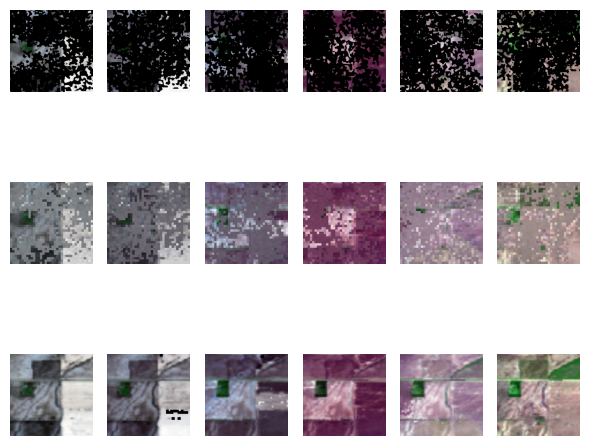

Validation Progress:   2%|▏         | 1/51 [00:05<04:45,  5.72s/it]

MSE 0.02047458104789257 SAM 0.25153083 PSNR 17.37502 SSIM 0.39763729328496716


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.018667..1.0083628].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027508577..0.9044202].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036850393..0.85405767].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.00021764604..0.96065146].


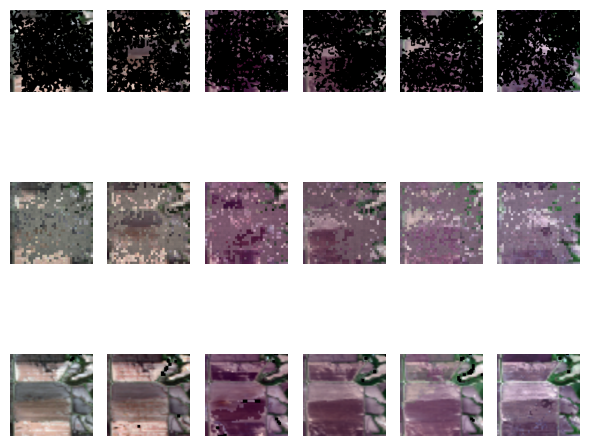

Validation Progress:   4%|▍         | 2/51 [00:11<04:32,  5.56s/it]

MSE 0.01934151165187359 SAM 0.24817902 PSNR 17.538559 SSIM 0.4143234748722067


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025986219..0.9698285].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05266314..0.9609281].


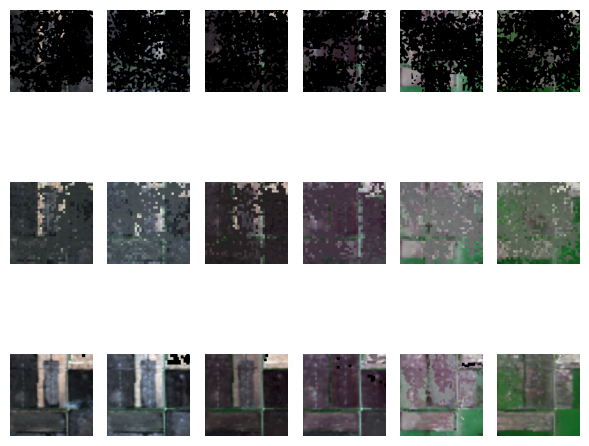

Validation Progress:   6%|▌         | 3/51 [00:16<04:25,  5.54s/it]

MSE 0.021079925820231438 SAM 0.30933297 PSNR 17.578741 SSIM 0.4294024786125124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07048682..0.62483764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13700864..0.8079521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.093083926..0.876481].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09291885..0.42354566].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15289633..0.81453377].


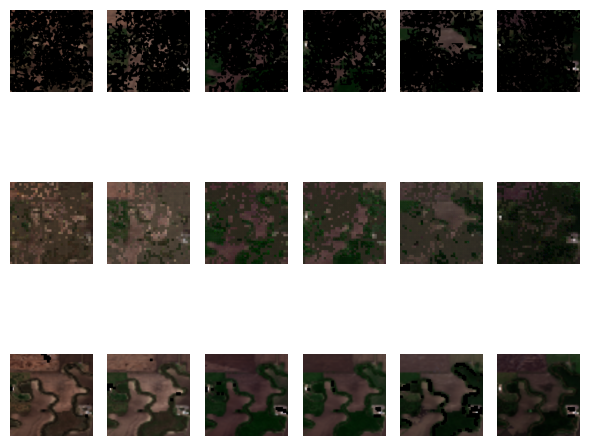

Validation Progress:   8%|▊         | 4/51 [00:22<04:18,  5.50s/it]

MSE 0.01754187047481537 SAM 0.24188527 PSNR 18.311893 SSIM 0.4165735072246696


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.01649874..1.0079294].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058299188..1.002415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0481687..1.0342102].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052031994..1.0134404].


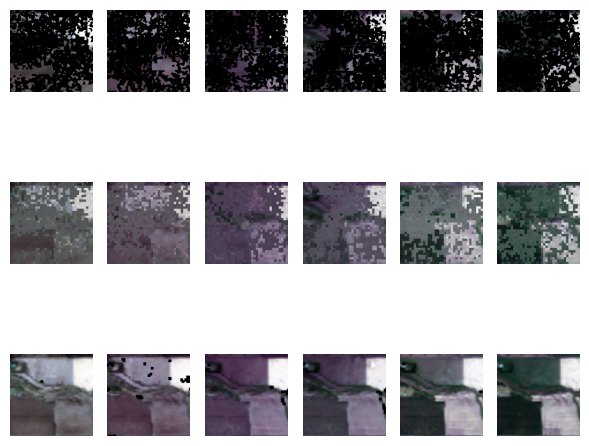

Validation Progress:  10%|▉         | 5/51 [00:27<04:17,  5.59s/it]

MSE 0.01898958720266819 SAM 0.2365358 PSNR 17.854424 SSIM 0.40477219776287643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042899467..0.94701046].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053191572..0.91316086].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020819483..0.91897994].


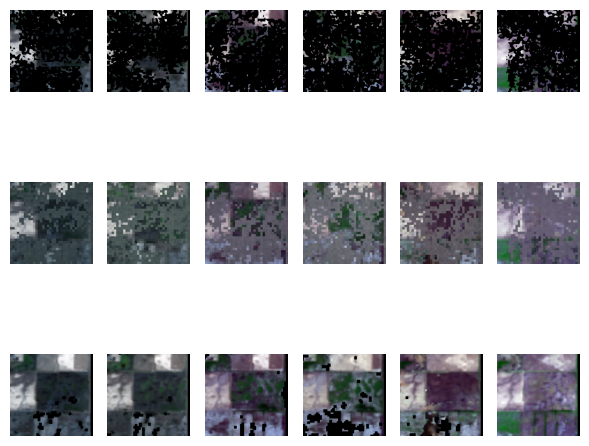

Validation Progress:  12%|█▏        | 6/51 [00:33<04:09,  5.55s/it]

MSE 0.016339819878339767 SAM 0.36920005 PSNR 18.436092 SSIM 0.4818676330706211


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062159497..0.47278255].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009716423..0.46700874].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0098872185..0.6613297].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09177579..0.8626081].


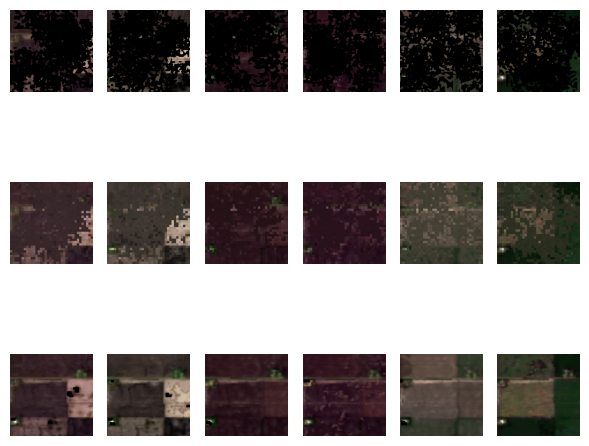

Validation Progress:  14%|█▎        | 7/51 [00:38<04:03,  5.53s/it]

MSE 0.017208334058523178 SAM 0.2513076 PSNR 18.25749 SSIM 0.4340786155536565


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0033795377..0.9889828].


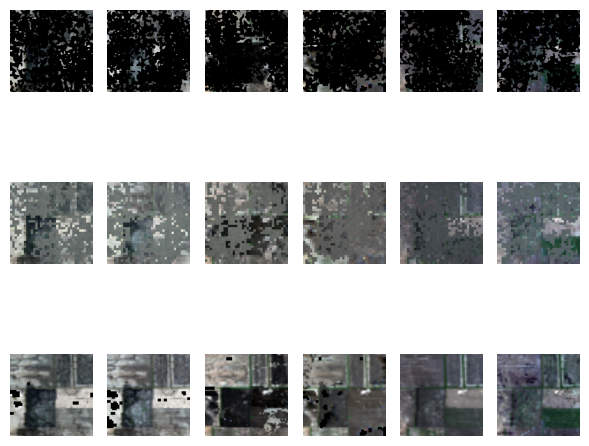

Validation Progress:  16%|█▌        | 8/51 [00:44<03:56,  5.50s/it]

MSE 0.01660829596221447 SAM 0.25308302 PSNR 18.305574 SSIM 0.43502693934760933


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029134022..0.044823807].


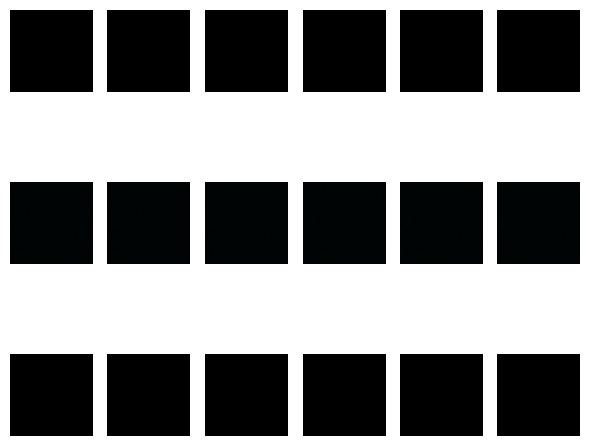

Validation Progress:  18%|█▊        | 9/51 [00:50<03:54,  5.58s/it]

MSE 0.015316739678382874 SAM 0.2867743 PSNR 21.532103 SSIM 0.44589025232084917


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011945813..1.0028976].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.003206483..0.9768572].


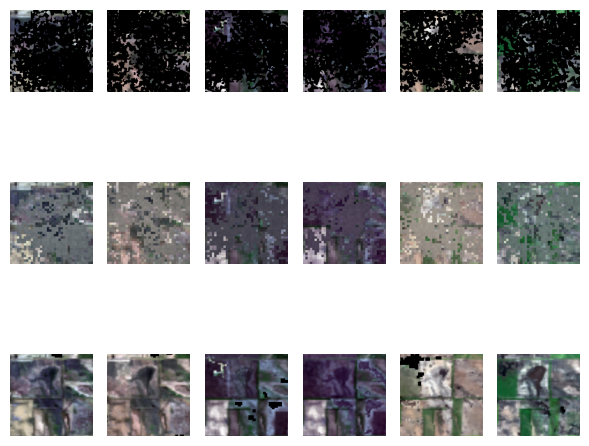

Validation Progress:  20%|█▉        | 10/51 [00:55<03:47,  5.54s/it]

MSE 0.01795179769396782 SAM 0.23438254 PSNR 18.076973 SSIM 0.41099967501822077


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01069464..0.8192357].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.050721057..0.73897225].


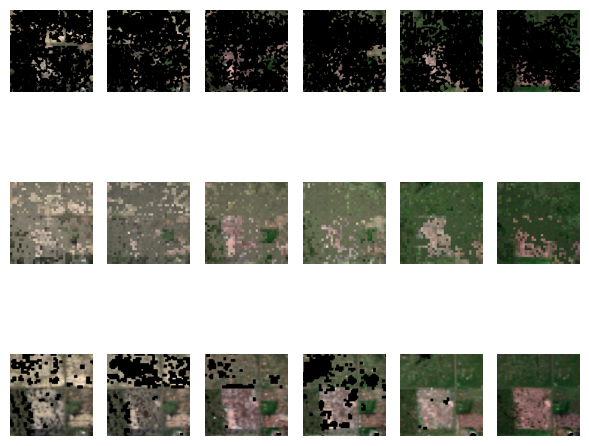

Validation Progress:  22%|██▏       | 11/51 [01:00<03:40,  5.51s/it]

MSE 0.01990525797009468 SAM 0.3077069 PSNR 17.608873 SSIM 0.4345190233336755


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04435362..1.0305339].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06826307..1.0223254].


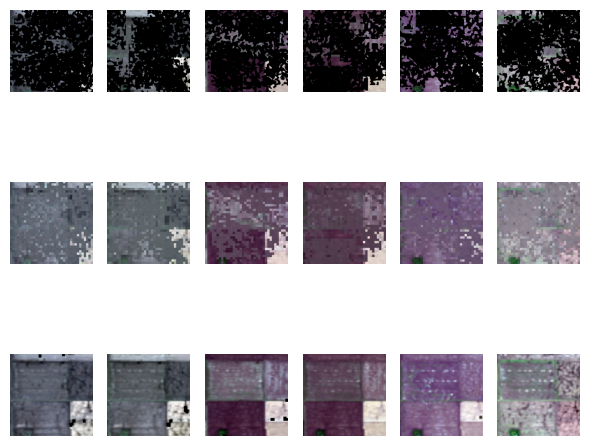

Validation Progress:  24%|██▎       | 12/51 [01:06<03:34,  5.49s/it]

MSE 0.016787957400083542 SAM 0.37173906 PSNR 18.823973 SSIM 0.46521535780276757


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04498026..0.63473845].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07238383..0.4169904].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14911978..0.77367586].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07840802..0.57189935].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14746428..0.34221026].


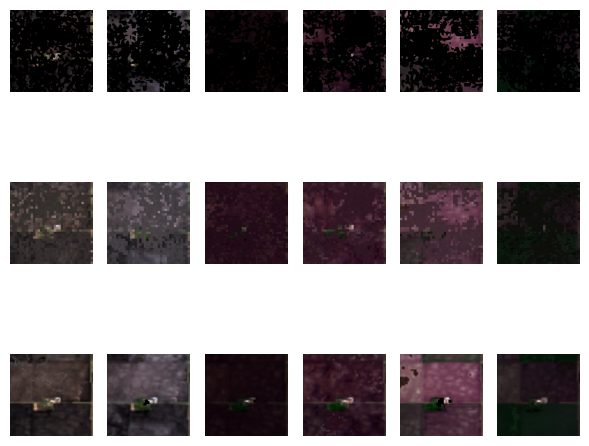

Validation Progress:  25%|██▌       | 13/51 [01:12<03:31,  5.57s/it]

MSE 0.01819048449397087 SAM 0.23347723 PSNR 17.951677 SSIM 0.41207229384284344


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034828838..0.923408].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02506485..0.80821836].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047087044..0.8711538].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0068443604..0.9877255].


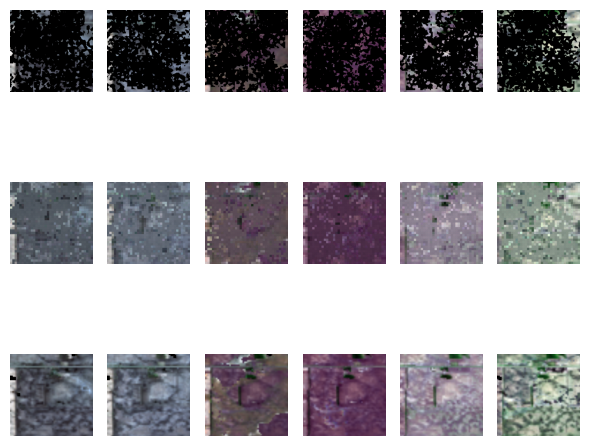

Validation Progress:  27%|██▋       | 14/51 [01:17<03:24,  5.53s/it]

MSE 0.017231063917279243 SAM 0.23853351 PSNR 18.119589 SSIM 0.4233177454876171


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053692672..0.90848].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1094796..0.7697427].


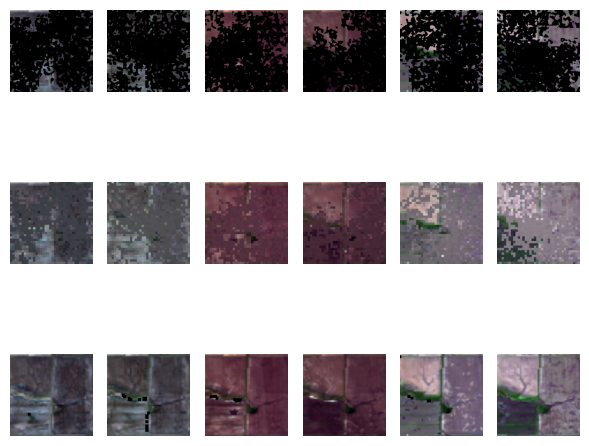

Validation Progress:  29%|██▉       | 15/51 [01:23<03:18,  5.51s/it]

MSE 0.020160231739282608 SAM 0.24995565 PSNR 17.567043 SSIM 0.4160785695193199


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029411707..1.0135206].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0227304..1.0419892].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06626688..0.9102798].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07048511..0.9804371].


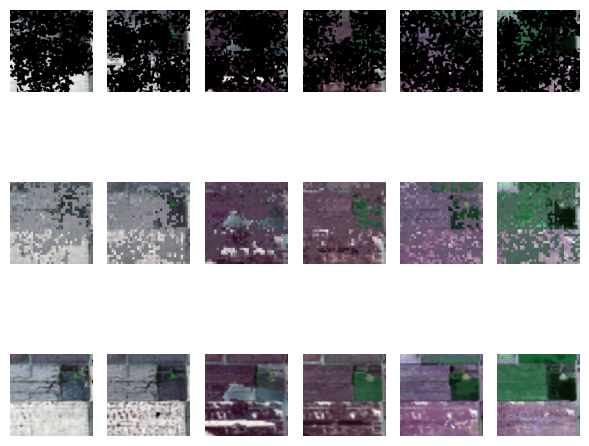

Validation Progress:  31%|███▏      | 16/51 [01:28<03:12,  5.49s/it]

MSE 0.01732730306684971 SAM 0.2982912 PSNR 18.332403 SSIM 0.450074269645532


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016695479..0.9074523].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056557335..0.96519417].


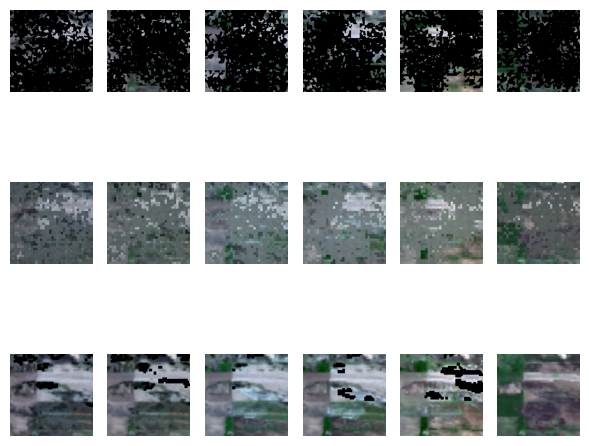

Validation Progress:  33%|███▎      | 17/51 [01:34<03:09,  5.58s/it]

MSE 0.018105177208781242 SAM 0.2970558 PSNR 18.18142 SSIM 0.43762127389354794


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10952891..0.7410072].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12358851..0.65751374].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12368007..0.5104347].


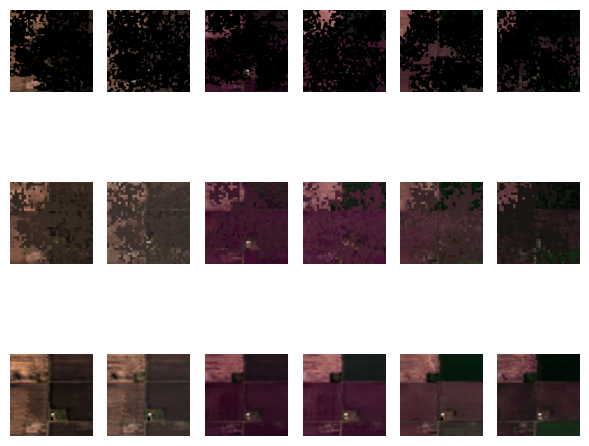

Validation Progress:  35%|███▌      | 18/51 [01:39<03:02,  5.54s/it]

MSE 0.018388327211141586 SAM 0.24396588 PSNR 17.928791 SSIM 0.42791088380290015


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16585623..1.0398002].


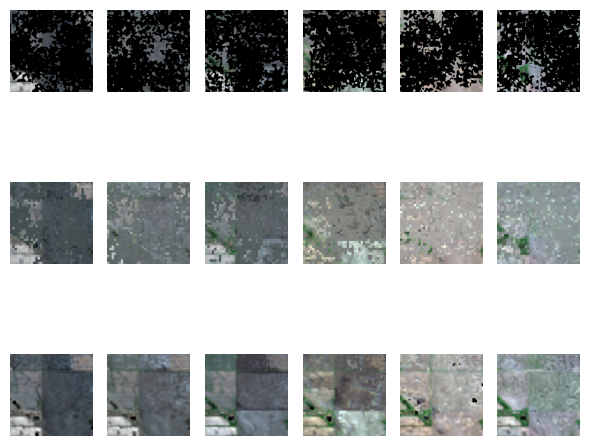

Validation Progress:  37%|███▋      | 19/51 [01:45<02:57,  5.55s/it]

MSE 0.014542371034622192 SAM 0.3567528 PSNR 24.645964 SSIM 0.48269529033751885


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045889333..0.9782555].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.066096716..0.98616976].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03714144..0.950152].


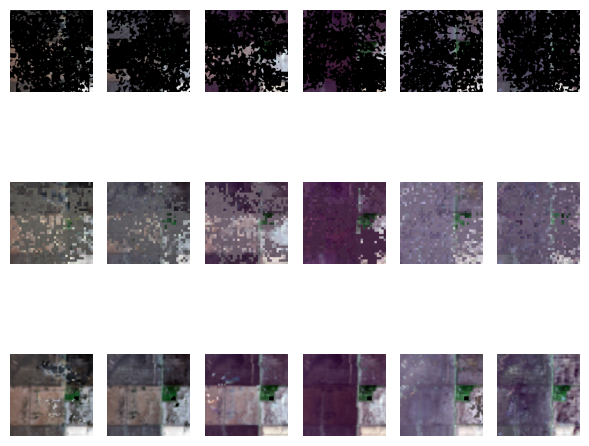

Validation Progress:  39%|███▉      | 20/51 [01:50<02:51,  5.52s/it]

MSE 0.01911959983408451 SAM 0.25963926 PSNR 17.782158 SSIM 0.4127044163011169


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14182377..1.0269377].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005643473..0.9712489].


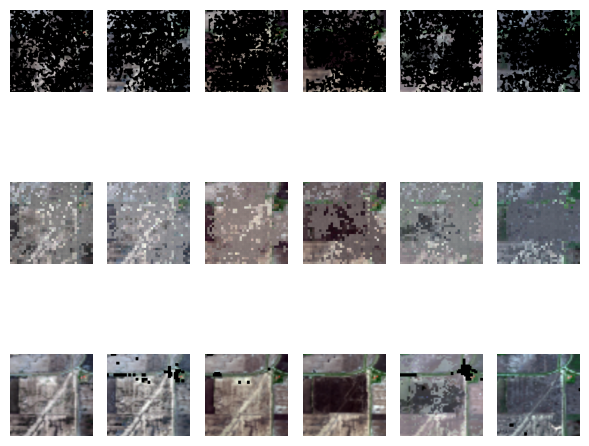

Validation Progress:  41%|████      | 21/51 [01:56<02:47,  5.59s/it]

MSE 0.017147066071629524 SAM 0.3092147 PSNR 21.094881 SSIM 0.44990032921441786


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0038488803..1.0544533].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0068299426..0.92596024].


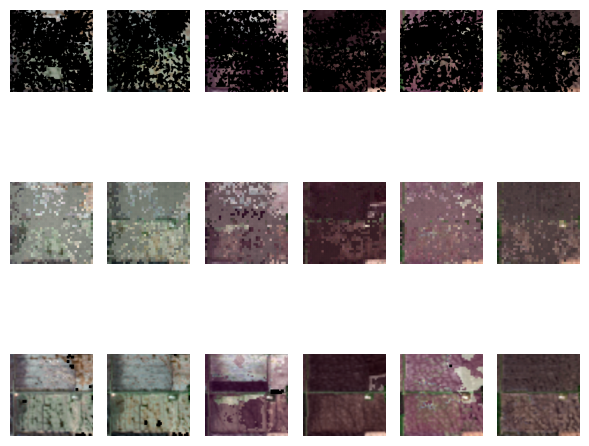

Validation Progress:  43%|████▎     | 22/51 [02:01<02:40,  5.55s/it]

MSE 0.018753385171294212 SAM 0.2482643 PSNR 17.86582 SSIM 0.423420729812347


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022095717..0.8994892].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09316373..0.75198996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0903138..0.77331865].


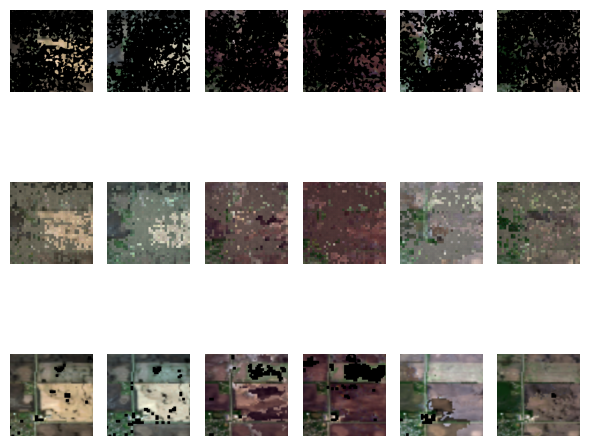

Validation Progress:  45%|████▌     | 23/51 [02:07<02:34,  5.53s/it]

MSE 0.01611952856183052 SAM 0.37239495 PSNR 21.34341 SSIM 0.49064862162760714


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0584656..0.8861838].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017307952..0.94583195].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0717877..0.88066393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08116948..1.0040909].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02977134..0.77456725].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.049231227..0.9670491].


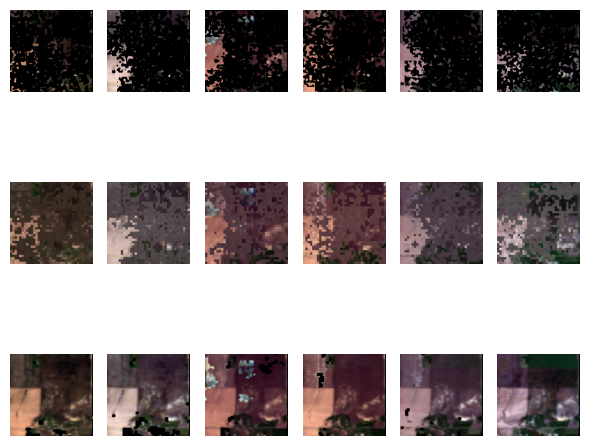

Validation Progress:  47%|████▋     | 24/51 [02:12<02:28,  5.50s/it]

MSE 0.019463371485471725 SAM 0.2502493 PSNR 17.646688 SSIM 0.41945602059268483


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.18922257..1.0058658].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0335846..1.015546].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.17399864..1.0996729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028856477..1.0702566].


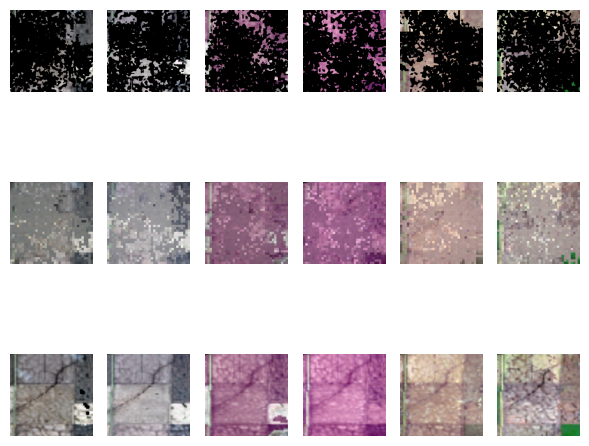

Validation Progress:  49%|████▉     | 25/51 [02:18<02:25,  5.59s/it]

MSE 0.017513813450932503 SAM 0.34619808 PSNR 21.029896 SSIM 0.45913221883387456


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017625352..0.9103202].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.102522835..0.9969334].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035967596..0.8671223].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16878235..0.82715327].


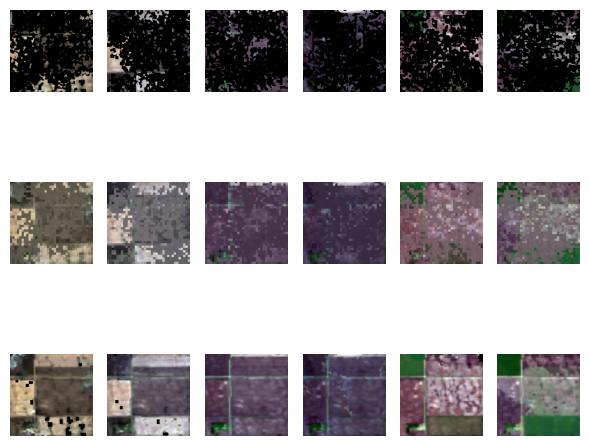

Validation Progress:  51%|█████     | 26/51 [02:24<02:18,  5.55s/it]

MSE 0.019839772954583168 SAM 0.27068922 PSNR 17.564642 SSIM 0.4087471625700475


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.15445085..1.0072558].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08661004..0.9312695].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020007294..0.9864105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015106566..0.82984316].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.049257595..0.82954305].


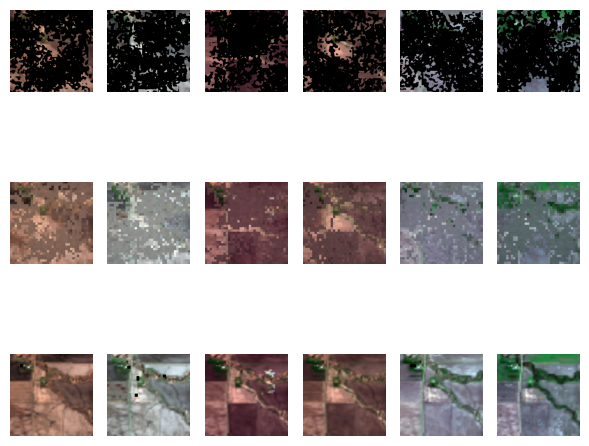

Validation Progress:  53%|█████▎    | 27/51 [02:29<02:13,  5.54s/it]

MSE 0.015672976151108742 SAM 0.3744719 PSNR 21.57656 SSIM 0.4729216543587145


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006196172..1.0245681].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03356975..1.0601788].


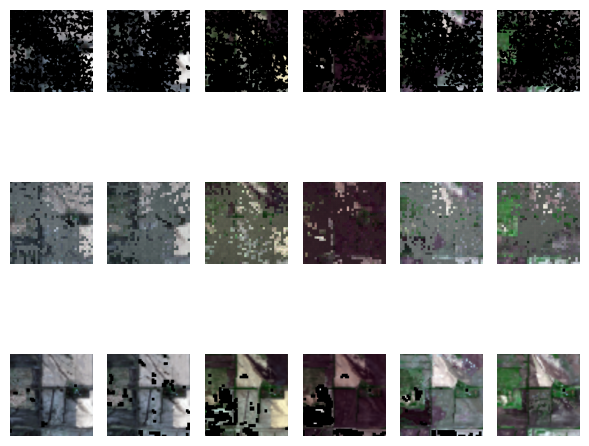

Validation Progress:  55%|█████▍    | 28/51 [02:35<02:06,  5.51s/it]

MSE 0.017879026010632515 SAM 0.24505799 PSNR 18.064014 SSIM 0.4216512536822635


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.031097233..1.0041194].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03717795..1.0283695].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05911136..1.038795].


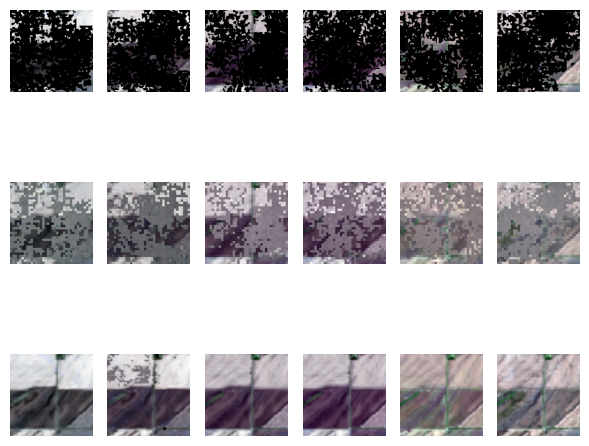

Validation Progress:  57%|█████▋    | 29/51 [02:40<02:02,  5.59s/it]

MSE 0.018614908680319786 SAM 0.24791332 PSNR 17.976269 SSIM 0.424595359083815


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036568336..0.9683677].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059828166..1.0378851].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09445094..0.81682026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052148394..0.9791445].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05495268..0.95234984].


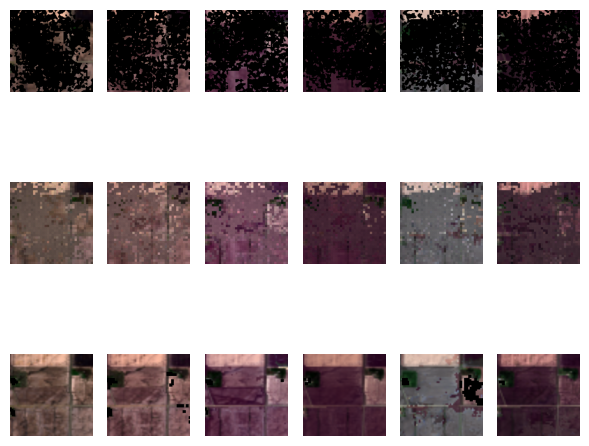

Validation Progress:  59%|█████▉    | 30/51 [02:46<01:56,  5.55s/it]

MSE 0.01531771570444107 SAM 0.25973856 PSNR 18.72712 SSIM 0.4392661997019949


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04342328..0.6155069].


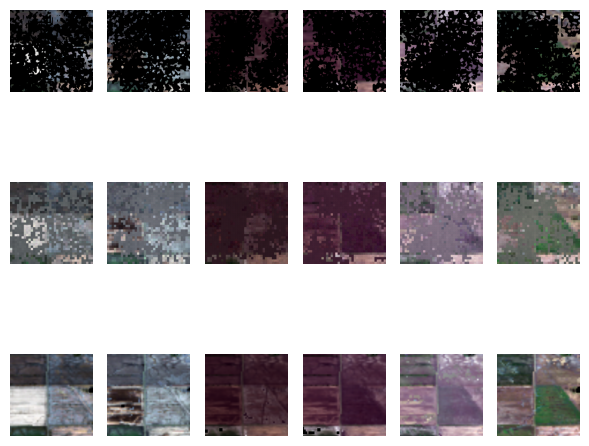

Validation Progress:  61%|██████    | 31/51 [02:51<01:50,  5.51s/it]

MSE 0.016742728650569916 SAM 0.23084775 PSNR 18.222153 SSIM 0.42651558472820766


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.054150626..1.0756731].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0436713..0.947381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.005759058..1.0144745].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.055284556..1.0231428].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07920924..0.8732068].


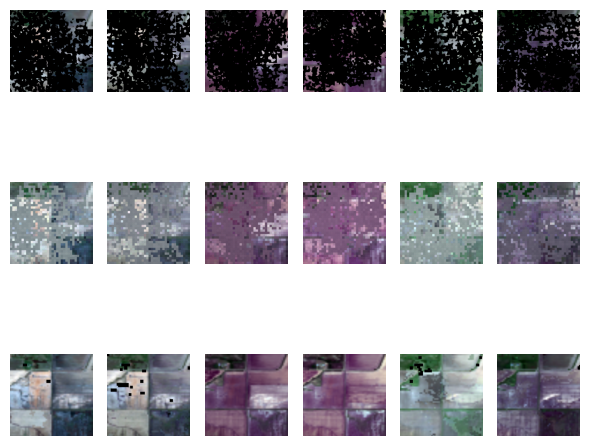

Validation Progress:  63%|██████▎   | 32/51 [02:57<01:44,  5.49s/it]

MSE 0.018902849406003952 SAM 0.2731261 PSNR 17.894403 SSIM 0.4273417141898693


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07555416..0.6538477].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.083600834..0.5918599].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.080079444..0.86529326].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13290271..0.46220523].


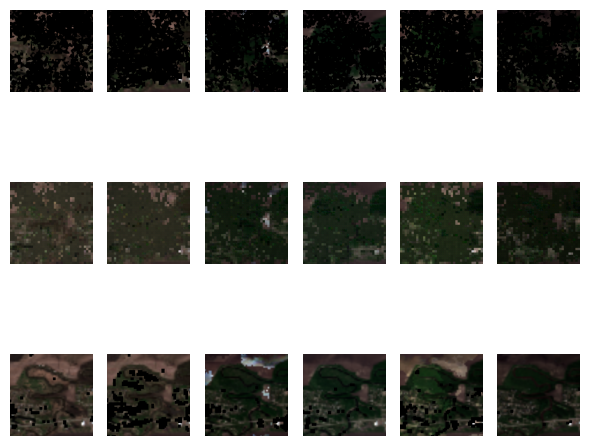

Validation Progress:  65%|██████▍   | 33/51 [03:02<01:40,  5.58s/it]

MSE 0.018185576424002647 SAM 0.23643559 PSNR 17.981627 SSIM 0.422584305339489


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07331009..1.0238678].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04600739..0.98449636].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0019454099..0.9163866].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07601945..0.88290536].


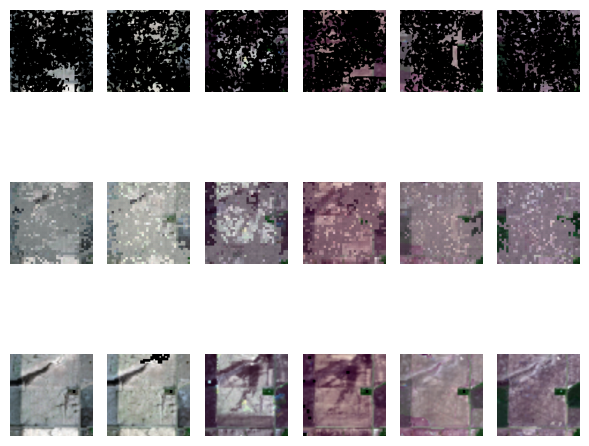

Validation Progress:  67%|██████▋   | 34/51 [03:08<01:34,  5.54s/it]

MSE 0.01748877577483654 SAM 0.2853656 PSNR 18.070484 SSIM 0.4377200143672735


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.087603554..1.001646].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043837447..1.0196612].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026388759..1.0004045].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.067921214..1.036638].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.004505872..0.9820869].


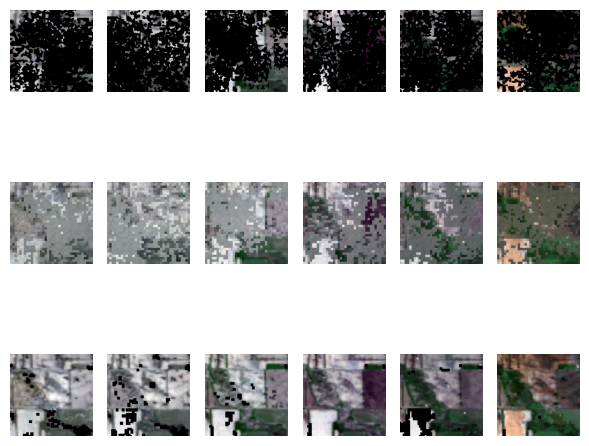

Validation Progress:  69%|██████▊   | 35/51 [03:13<01:28,  5.56s/it]

MSE 0.018222447484731674 SAM 0.27370152 PSNR 18.00675 SSIM 0.42511390991126863


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0056537064..1.1409136].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008785374..1.0346766].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0147349015..1.0168772].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.021335606..1.0076296].


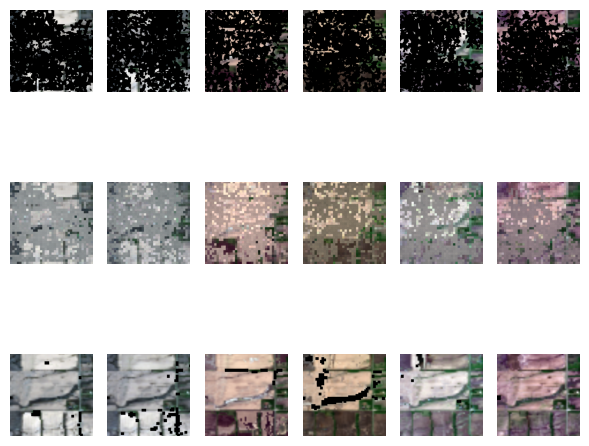

Validation Progress:  71%|███████   | 36/51 [03:19<01:23,  5.56s/it]

MSE 0.015318791382014751 SAM 0.33759114 PSNR 21.61347 SSIM 0.47412160882097165


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024740832..0.91076934].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07958999..0.8907418].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.035353217..0.946128].


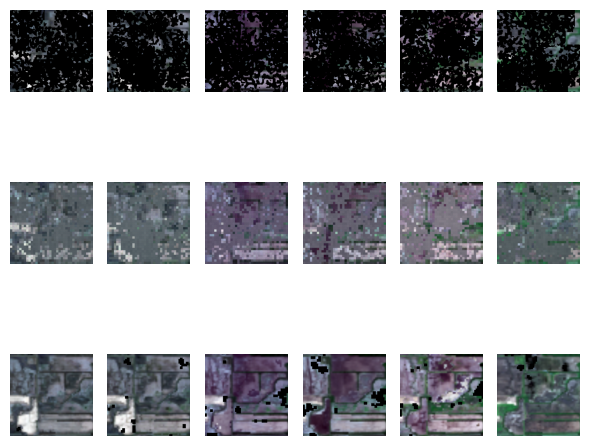

Validation Progress:  73%|███████▎  | 37/51 [03:25<01:19,  5.66s/it]

MSE 0.01654358021914959 SAM 0.32679683 PSNR 18.596117 SSIM 0.45198496344781675


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05938082..0.7074143].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05096181..0.56497264].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07134721..0.67458874].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047038637..0.7654665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006714917..0.81632143].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06350786..0.89428145].


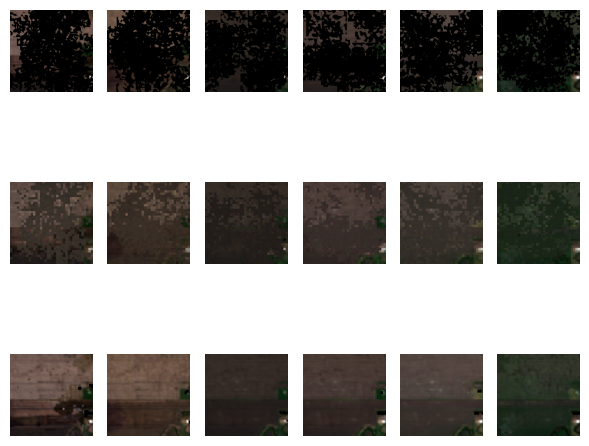

Validation Progress:  75%|███████▍  | 38/51 [03:31<01:13,  5.65s/it]

MSE 0.017581211403012276 SAM 0.26733893 PSNR 18.156076 SSIM 0.43305079807905944


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0189682..0.8553156].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021367531..0.8211642].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03450941..0.91644573].


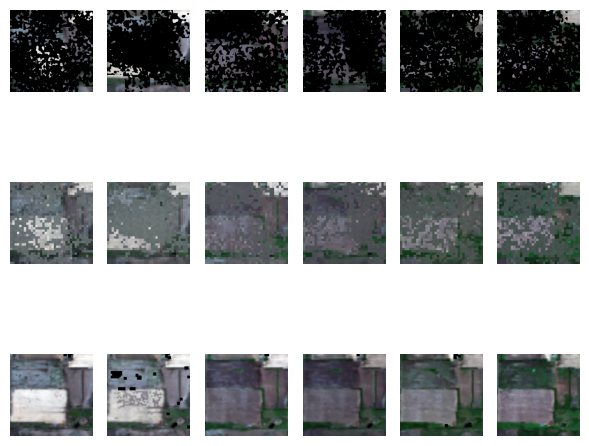

Validation Progress:  76%|███████▋  | 39/51 [03:36<01:07,  5.64s/it]

MSE 0.017977464944124222 SAM 0.29365903 PSNR 17.981533 SSIM 0.4359763131169603


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028367002..1.0212612].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01503551..0.8287947].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11869758..0.70719075].


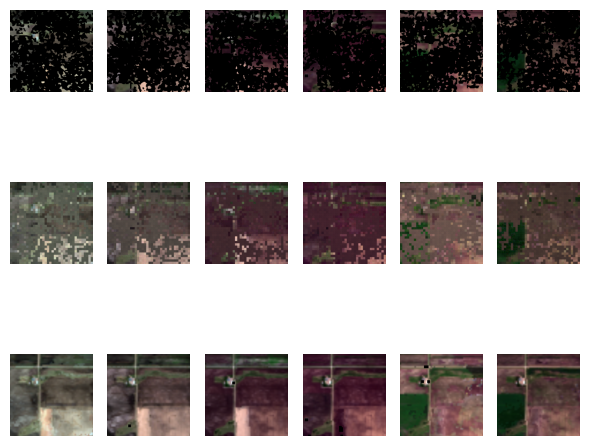

Validation Progress:  78%|███████▊  | 40/51 [03:42<01:01,  5.61s/it]

MSE 0.017369931563735008 SAM 0.23624644 PSNR 18.14915 SSIM 0.41427300562889857


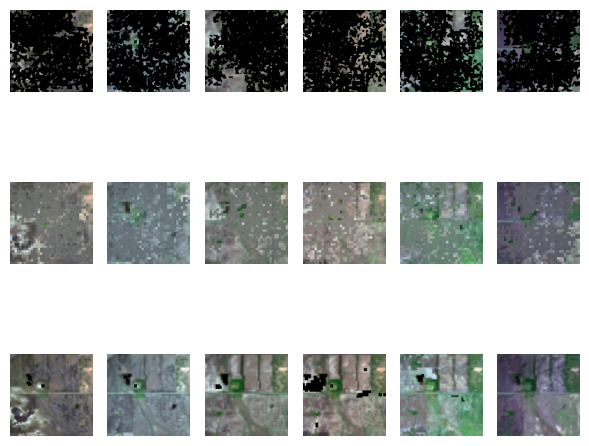

Validation Progress:  80%|████████  | 41/51 [03:48<00:56,  5.69s/it]

MSE 0.01958049088716507 SAM 0.2373802 PSNR 17.620893 SSIM 0.4044623567273828


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.059281774..1.0201699].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.061262816..1.0203797].


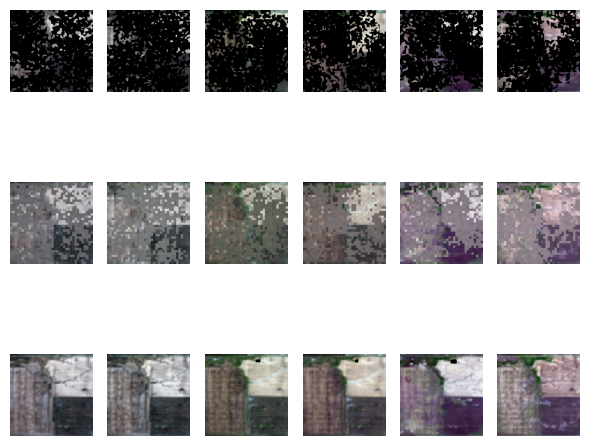

Validation Progress:  82%|████████▏ | 42/51 [03:53<00:51,  5.69s/it]

MSE 0.017998985946178436 SAM 0.2332848 PSNR 18.094809 SSIM 0.40395251329845716


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.052821748..1.0107375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.099008396..1.01109].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017046845..1.1718078].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0020394225..0.81550145].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09010922..0.91050625].


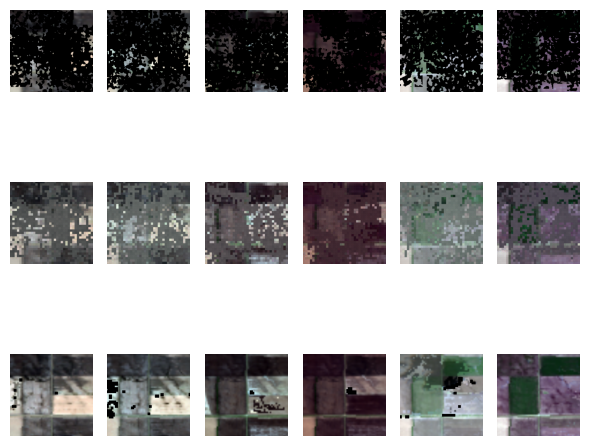

Validation Progress:  84%|████████▍ | 43/51 [03:59<00:45,  5.66s/it]

MSE 0.01697559282183647 SAM 0.23889299 PSNR 18.172894 SSIM 0.414287787133407


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051059358..0.9111401].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036719088..0.8430493].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014669782..0.9746837].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029897872..0.94795996].


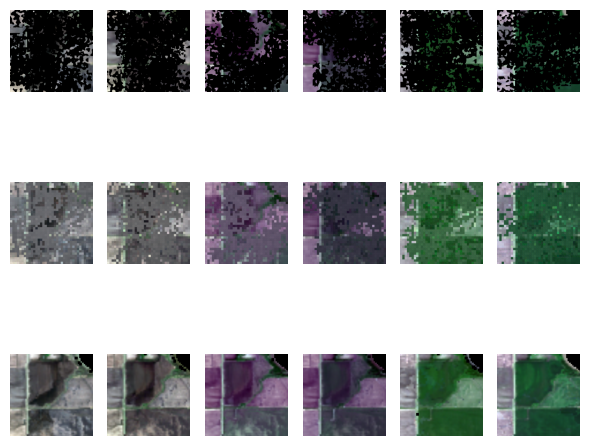

Validation Progress:  86%|████████▋ | 44/51 [04:05<00:39,  5.67s/it]

MSE 0.01658579520881176 SAM 0.24829888 PSNR 18.596668 SSIM 0.43306865952196116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0031947347..0.91671014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023838233..0.9342111].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07029008..1.0249608].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.073208734..0.8071721].


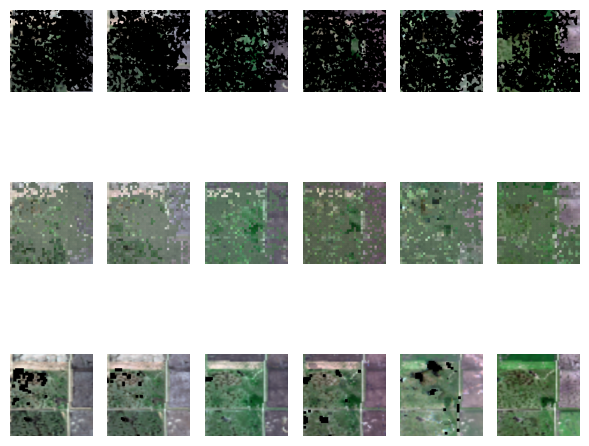

Validation Progress:  88%|████████▊ | 45/51 [04:11<00:34,  5.78s/it]

MSE 0.01697191409766674 SAM 0.30283022 PSNR 21.052956 SSIM 0.44844526182003014


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028493606..0.73777103].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.041162718..0.64213467].


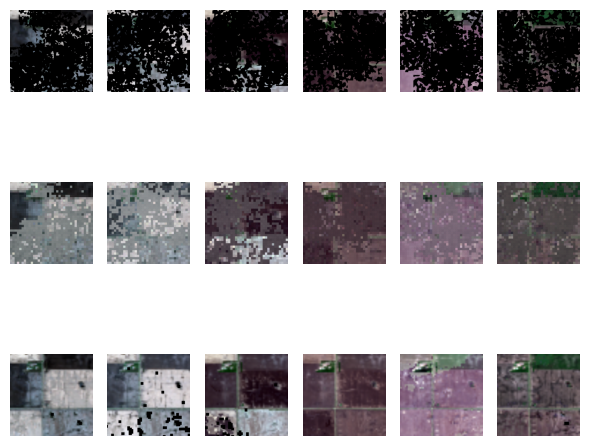

Validation Progress:  90%|█████████ | 46/51 [04:16<00:28,  5.76s/it]

MSE 0.017479293048381805 SAM 0.27163017 PSNR 18.107327 SSIM 0.4347884134635312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.058101412..1.0491675].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0020822608..0.95073116].


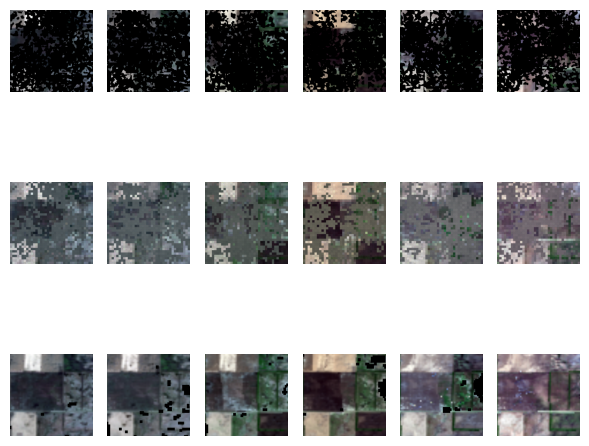

Validation Progress:  92%|█████████▏| 47/51 [04:22<00:22,  5.74s/it]

MSE 0.017681291326880455 SAM 0.27173993 PSNR 18.128075 SSIM 0.4448866871177083


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05836011..0.93570626].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03245707..1.00729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055206902..0.9386811].


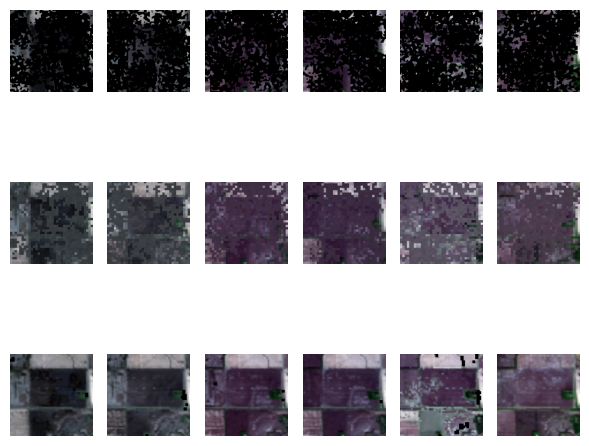

Validation Progress:  94%|█████████▍| 48/51 [04:28<00:17,  5.72s/it]

MSE 0.018485669046640396 SAM 0.30181366 PSNR 18.169088 SSIM 0.442211778346192


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018298805..1.0046806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017691638..1.0512199].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.121987045..0.8445465].


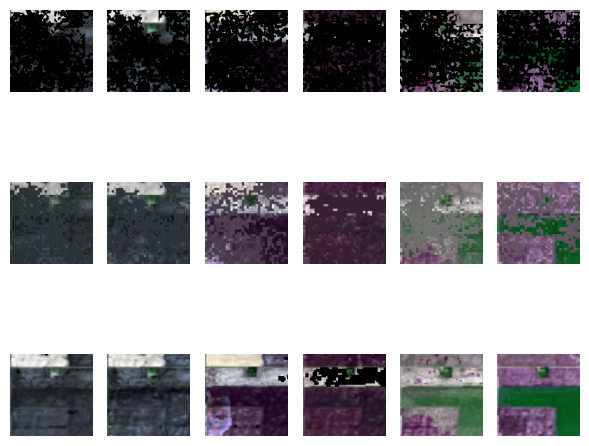

Validation Progress:  96%|█████████▌| 49/51 [04:34<00:11,  5.82s/it]

MSE 0.018480656668543816 SAM 0.23966847 PSNR 17.908794 SSIM 0.4270076711396548


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036793243..1.0166343].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0065227933..1.006124].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02422645..0.962359].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023397991..1.0933186].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13673827..0.60044503].


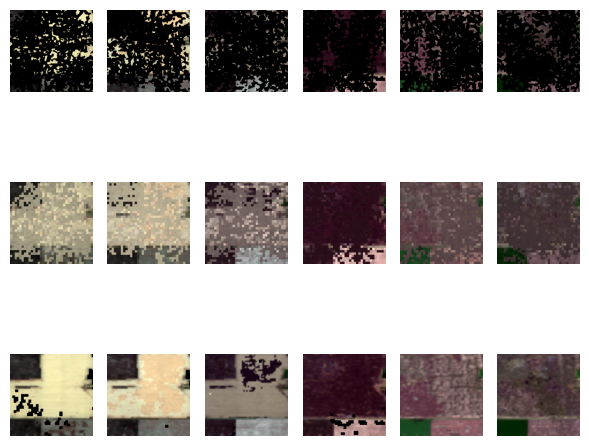

Validation Progress:  98%|█████████▊| 50/51 [04:40<00:05,  5.91s/it]

MSE 0.019112667068839073 SAM 0.27483258 PSNR 17.795149 SSIM 0.4205804803735637


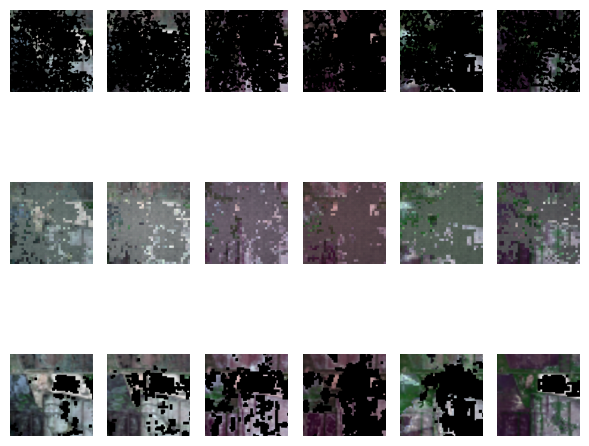

Validation Progress: 100%|██████████| 51/51 [04:44<00:00,  5.58s/it]

MSE 0.01642538607120514 SAM 0.25322196 PSNR 18.52939 SSIM 0.43784729619474466
Validation Loss: 43.7337, MSE: 0.0178, SAM: 0.2764, PSNR: 18.6264, SSIM: 0.4334


In [25]:
model.eval()
val_loss = 0.0
mse, sam, psnr, ssim = 0, 0, 0, 0

if if_write:
    os.makedirs(outputs_folder, exist_ok=True)
    os.makedirs(targets_folder, exist_ok=True)
    os.makedirs(inputs_folder, exist_ok=True)
    os.makedirs(cloud_mask_folder, exist_ok=True)

# Start validation
with torch.no_grad():
    # Wrap valloader with tqdm for progress tracking
    for batch_idx, (
        inputs,
        targets,
        cloud_mask,
        cloud_mask_added,
        file_name,
    ) in enumerate(tqdm(valloader, desc="Validation Progress")):
        split_inputs = torch.split(inputs, 11, dim=1)  # 切分为 6 个 [48, 11, 180, 180]
        output_list = []
        for split_input in split_inputs:
            split_input = split_input.to(device)
            output = model(split_input)
            output_list.append(output.cpu())

        outputs = torch.cat(output_list, dim=1).to(
            device
        )  # 重新拼接回原来的 channel 结构
        # outputs = model(inputs.to(device))

        visualize_images(inputs, outputs, cloud_mask, cloud_mask_added, targets)

        B, C, H, W = inputs.shape
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.repeat_interleave(11, dim=1).to(device)
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)

        # Normalize the masked regions to avoid scale bias
        valid_pixels = cloud_mask.sum()
        if valid_pixels > 0:
            loss = (
                criterion(
                    masked_outputs.to(device),
                    masked_targets.to(device),
                )
                # / valid_pixels
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)

        val_loss += loss.item()

        if if_write:
            for i in range(B):  # Process each item in the batch
                base_filename = os.path.splitext(file_name[i])[0]
                output_filename = os.path.join(
                    outputs_folder, f"{base_filename}_output.tiff"
                )
                target_filename = os.path.join(
                    targets_folder, f"{base_filename}_target.tiff"
                )
                input_filename = os.path.join(
                    inputs_folder, f"{base_filename}_input.tiff"
                )
                cloud_mask_filename = os.path.join(
                    cloud_mask_folder, f"{base_filename}_cloud_mask.tiff"
                )

                write_tiff(output_path=target_filename, image=targets[i].cpu().numpy())
                write_tiff(output_path=output_filename, image=outputs[i].cpu().numpy())
                write_tiff(output_path=input_filename, image=inputs[i].cpu().numpy())
                write_tiff(
                    output_path=cloud_mask_filename, image=cloud_mask[i].cpu().numpy()
                )
        # Compute additional metrics
        masked_outputs_np = masked_outputs.cpu().numpy()
        masked_targets_np = masked_targets.cpu().numpy()

        current_mse = mean_squared_error(
            masked_targets_np.flatten(), masked_outputs_np.flatten()
        )
        mse += current_mse

        current_sam = spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
        sam += current_sam

        current_psnr = peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
        psnr += current_psnr

        current_ssim = structural_similarity_index(masked_targets_np, masked_outputs_np)
        ssim += current_ssim

        print(
            "MSE",
            current_mse,
            "SAM",
            current_sam,
            "PSNR",
            current_psnr,
            "SSIM",
            current_ssim,
        )
    mse /= len(valloader)
    sam /= len(valloader)
    psnr /= len(valloader)
    ssim /= len(valloader)

    print(
        f"Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}"
    )